# Instacart Market Basket Analysis

- Aishwarya Mundhe aam453@drexel.edu
- Sabarnath Maddinieni scm345@drexel.edu
- Toby Sheung tls357@drexel.edu

## Project Overview:
Many companies are looking for ways to earn more money and in today's technological world, businesses are trying to use data science to understand how customers are buying products. Most customers when going on a grocery run, will not just buy one product. They will buy multiple items especially if it is an online grocery ordering and delivery app such as Instacart. We hope to use a dataset from Instacart to develop an association and correlation analysis with Market Basket Analysis. We will try to predict what products a customer will buy next from the previous orders and items they currently have in their cart. We also will find patterns among customers by the products they bought previously. 

## Business Problem
Use this anonymized data on customer orders over time. We will be using this data to apply the methods of Data Mining such as Market Basket Analysis and Customer segmentation and report the findings.

In [182]:
#pip install mlxtend

In [183]:
#Libaries and Packages
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import seaborn as sns
from mlxtend.frequent_patterns import apriori, association_rules

## Examination of the Datasets

In [184]:
#Input the Datasets
sample = pd.read_csv("data/sample_submission.csv")
order = pd.read_csv("data/orders.csv")
departments = pd.read_csv("data/departments.csv")
products = pd.read_csv("data/products.csv")
aisles = pd.read_csv("data/aisles.csv")
prior = pd.read_csv("data/order_products_prior.csv")
train = pd.read_csv("data/order_products_train.csv")

In [185]:
# Type of data
print(type(order))
print(type(departments))
print(type(products))
print(type(aisles))
print(type(prior))
print(type(train))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


In [186]:
train.head(5)

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


In [187]:
train['reordered'].value_counts()

1    828824
0    555793
Name: reordered, dtype: int64

The reordered columns shows how many times a customer reordered a product they previously bought. It shows that 0.59% of all customers reordered a product they bought before. Research finds that keeping customers are much less expensive to the company than trying to gain new customers.

In [188]:
prior.head(5)

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


The order_products_prior dataset details the order id, product id, the order of purchase and if the customer reordered the same product. It contains over 1,000,000 rows.

In [189]:
order.head(5)

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0


The orders dataset contains information about the time of day and hour a customer purchased a product. The order in which they ordered an item is also an important value.

In [190]:
departments.head(5)

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


The department dataset details the department id and the department associated to each product. It contains 21 different departments.

In [191]:
products.head(5)

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


The products dataset details the product id, product name, aisle id and department id. It contains over 40,000 rows.

In [192]:
aisles.head(5)

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


The aisles dataset details the aisle id and the aisle name for each product. It contains 134 rows which refers to the number of different aisles.

In [193]:
order.isna().sum()

order_id                       0
user_id                        0
eval_set                       0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    206209
dtype: int64

In [194]:
prior.describe()

,order_id,product_id,add_to_cart_order,reordered
count,3.243449e+07,3.243449e+07,3.243449e+07,3.243449e+07
mean,1.710749e+06,2.557634e+04,8.351076e+00,5.896975e-01
std,9.873007e+05,1.409669e+04,7.126671e+00,4.918886e-01
min,2.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00
25%,8.559430e+05,1.353000e+04,3.000000e+00,0.000000e+00
50%,1.711048e+06,2.525600e+04,6.000000e+00,1.000000e+00
75%,2.565514e+06,3.793500e+04,1.100000e+01,1.000000e+00
max,3.421083e+06,4.968800e+04,1.450000e+02,1.000000e+00


In [195]:
pcorr = prior.corr(method='pearson')
pcorr

,order_id,product_id,add_to_cart_order,reordered
order_id,1.000000,-0.000082,-0.000320,-0.000253
product_id,-0.000082,1.000000,0.005529,0.003718
add_to_cart_order,-0.000320,0.005529,1.000000,-0.133024
reordered,-0.000253,0.003718,-0.133024,1.000000


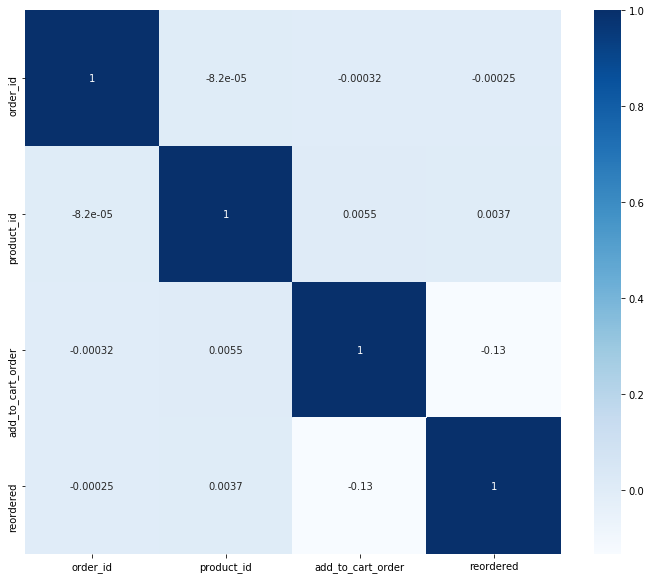

In [196]:
plt.figure(figsize=(12,10))
sns.heatmap(pcorr, annot=True, cmap=plt.cm.Blues)
plt.show()

The correlation plot of the order_products_prior show that there may be the smallest slight positive correlation between reordered and the order that the item was added to the cart. It shows that it may be possible that the order of which items were added could help to influence if a customer will reorder that product. 

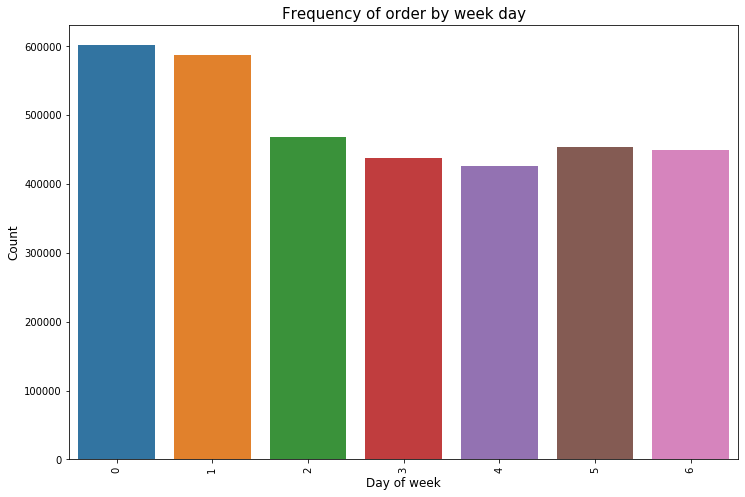

In [197]:
plt.figure(figsize=(12,8))
sns.countplot(x="order_dow", data=order)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Day of week', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Frequency of order by week day", fontsize=15)
plt.show()

This barplot shows which days customers like to shop. As you can see, Sunday and Mondays are days that most customers want to shop for food. It is the start of the week and it is important for the company to focus on enough supplies for these days. The Instacart application can target these days to gain more revenue.

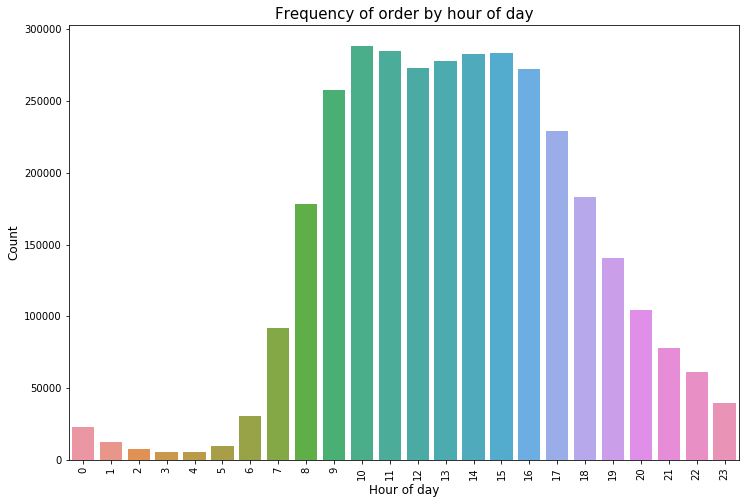

In [198]:
plt.figure(figsize=(12,8))
sns.countplot(x="order_hour_of_day", data=order)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Hour of day', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Frequency of order by hour of day", fontsize=15)
plt.show()

This barplot shows which hours of the day customers most likely order products. It shows that 10am to 4pm are the hours in which people buy products. 

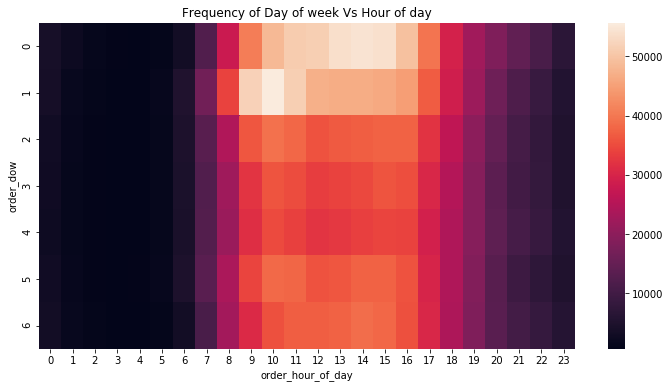

In [199]:
group = order.groupby(["order_dow", "order_hour_of_day"])["order_number"].aggregate("count").reset_index()
group = group.pivot('order_dow', 'order_hour_of_day', 'order_number')

plt.figure(figsize=(12,6))
sns.heatmap(group)
plt.title("Frequency of Day of week Vs Hour of day")
plt.show()

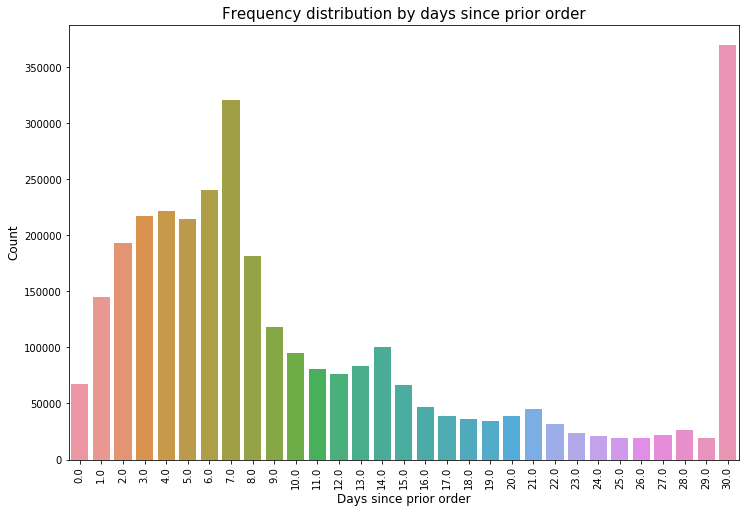

In [200]:
plt.figure(figsize=(12,8))
sns.countplot(x="days_since_prior_order", data=order)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Days since prior order', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Frequency distribution by days since prior order", fontsize=15)
plt.show()

This barplot shows the days since a customer has reordered the product. It shows that customers will likely reorder after 1 week and after 1 month. 

In [201]:
group = prior.groupby("order_id")["reordered"].aggregate("sum").reset_index()
group["reordered"][group["reordered"]>1] = 1
group.reordered.value_counts() / group.shape[0]

1    0.879151
0    0.120849
Name: reordered, dtype: float64

This shows the count of how many customers reordered a product more than once within the prior dataset. It shows that 0.88 of users reorder an item more than one time.  

In [202]:
group = train.groupby("order_id")["reordered"].aggregate("sum").reset_index()
group["reordered"][group["reordered"]>1] = 1
group.reordered.value_counts() / group.shape[0]

1    0.93444
0    0.06556
Name: reordered, dtype: float64

This shows the count of how many customers reordered a product more than once within the train dataset. It shows that 0.93 of users reorder an item more than one time.  

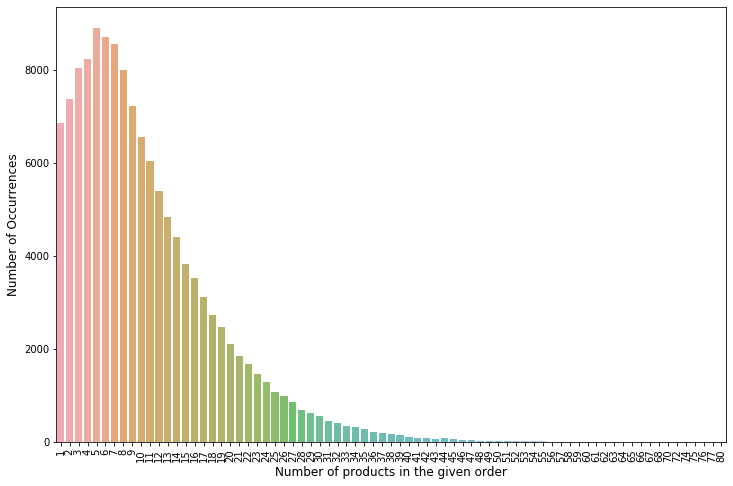

In [203]:
group = train.groupby("order_id")["add_to_cart_order"].aggregate("max").reset_index()
cnt_ = group.add_to_cart_order.value_counts()

plt.figure(figsize=(12,8))
sns.barplot(cnt_.index, cnt_.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Number of products in the given order', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

This barplot shows the number of times a certain number of products are added into the cart. Most customers buy about an average of 6 products per order. The most items customers have bought is in the 40-50 range. But most users buy about 5-9 items per order.

### Merging Order Product Prior and Products

In [204]:
order_products_prior_df = pd.merge(prior, products, on='product_id', how='left')
order_products_prior_df = pd.merge(order_products_prior_df, aisles, on='aisle_id', how='left')
order_products_prior = pd.merge(order_products_prior_df, departments, on='department_id', how='left')
order_products_prior.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department
0,2,33120,1,1,Organic Egg Whites,86,16,eggs,dairy eggs
1,2,28985,2,1,Michigan Organic Kale,83,4,fresh vegetables,produce
2,2,9327,3,0,Garlic Powder,104,13,spices seasonings,pantry
3,2,45918,4,1,Coconut Butter,19,13,oils vinegars,pantry
4,2,30035,5,0,Natural Sweetener,17,13,baking ingredients,pantry


### Frequency of Products

In [205]:
cnt_srs = order_products_prior['product_name'].value_counts().reset_index().head(20)
cnt_srs.columns = ['product_name', 'frequency_count']
cnt_srs

,product_name,frequency_count
0,Banana,472565
1,Bag of Organic Bananas,379450
2,Organic Strawberries,264683
3,Organic Baby Spinach,241921
4,Organic Hass Avocado,213584
5,Organic Avocado,176815
6,Large Lemon,152657
7,Strawberries,142951
8,Limes,140627
9,Organic Whole Milk,137905


## Customer Segmentation

Here we want to form customer segmentations based on the different purchases made by different customers. But since there are alot of products given in this data, it is easier to norrow the products down to the aisles. Similar products are found in similar aisles, aisles are basically categories of products. 

Even by reducing the products to aisles we still need to perform feature reduction due to the size of the data. We used Principal Component Analysis for feature discovery and then kmeans to cluster data. We then explored the clusters.


In [206]:
_mt = pd.merge(prior,products, on = ['product_id','product_id'])
_mt = pd.merge(_mt,order,on=['order_id','order_id'])
cs = pd.merge(_mt,aisles,on=['aisle_id','aisle_id'])

In [207]:
cs.head(15)

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,aisle
0,2,33120,1,1,Organic Egg Whites,86,16,202279,prior,3,5,9,8.0,eggs
1,26,33120,5,0,Organic Egg Whites,86,16,153404,prior,2,0,16,7.0,eggs
2,120,33120,13,0,Organic Egg Whites,86,16,23750,prior,11,6,8,10.0,eggs
3,327,33120,5,1,Organic Egg Whites,86,16,58707,prior,21,6,9,8.0,eggs
4,390,33120,28,1,Organic Egg Whites,86,16,166654,prior,48,0,12,9.0,eggs
5,537,33120,2,1,Organic Egg Whites,86,16,180135,prior,15,2,8,3.0,eggs
6,582,33120,7,1,Organic Egg Whites,86,16,193223,prior,6,2,19,10.0,eggs
7,608,33120,5,1,Organic Egg Whites,86,16,91030,prior,11,3,21,12.0,eggs
8,623,33120,1,1,Organic Egg Whites,86,16,37804,prior,63,3,12,3.0,eggs
9,689,33120,4,1,Organic Egg Whites,86,16,108932,prior,16,1,13,3.0,eggs


In [208]:
cs.shape

(32434489, 14)

In [209]:
cs['product_name'].value_counts()[0:10]

Banana                    472565
Bag of Organic Bananas    379450
Organic Strawberries      264683
Organic Baby Spinach      241921
Organic Hass Avocado      213584
Organic Avocado           176815
Large Lemon               152657
Strawberries              142951
Limes                     140627
Organic Whole Milk        137905
Name: product_name, dtype: int64

In [210]:
cs['aisle'].value_counts()[0:10]

fresh fruits                     3642188
fresh vegetables                 3418021
packaged vegetables fruits       1765313
yogurt                           1452343
packaged cheese                   979763
milk                              891015
water seltzer sparkling water     841533
chips pretzels                    722470
soy lactosefree                   638253
bread                             584834
Name: aisle, dtype: int64

As you can see, the top 10 products sold are fruits and vegetables. All these fruits and vegetables are found on the 'fresh fruit','fresh vegetable' and 'packaged vegetables fruits' aisles, the top 3 aisles. But we get to explore more products through aisles as you can see the top 10 ailes after fruits and vegetables there are snacks, water and bread. 

Analysis : Fresh fruits and fresh vegetables are the best selling goods.
<br>
<br>

Now, we are finding possible clusters of customers by substituting each user_id to a cluster they might belong to.
So first, we created a dataframe of each user and every purchase they made.

In [211]:
cust_prod = pd.crosstab(cs['user_id'], cs['aisle'])
cust_prod.head(10)

aisle,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,body lotions soap,bread,breakfast bakery,breakfast bars pastries,bulk dried fruits vegetables,bulk grains rice dried goods,buns rolls,butter,candy chocolate,canned fruit applesauce,canned jarred vegetables,canned meals beans,canned meat seafood,cat food care,cereal,chips pretzels,cleaning products,cocoa drink mixes,coffee,cold flu allergy,condiments,cookies cakes,crackers,cream,deodorants,diapers wipes,digestion,dish detergents,dog food care,doughs gelatins bake mixes,dry pasta,eggs,energy granola bars,energy sports drinks,eye ear care,facial care,feminine care,first aid,food storage,fresh dips tapenades,fresh fruits,fresh herbs,fresh pasta,fresh vegetables,frozen appetizers sides,frozen breads doughs,frozen breakfast,frozen dessert,frozen juice,frozen meals,frozen meat seafood,frozen pizza,frozen produce,frozen vegan vegetarian,fruit vegetable snacks,grains rice dried goods,granola,hair care,honeys syrups nectars,hot cereal pancake mixes,hot dogs bacon sausage,ice cream ice,ice cream toppings,indian foods,instant foods,juice nectars,kitchen supplies,kosher foods,latino foods,laundry,lunch meat,marinades meat preparation,meat counter,milk,mint gum,missing,more household,muscles joints pain relief,nuts seeds dried fruit,oils vinegars,oral hygiene,other,other creams cheeses,packaged cheese,packaged meat,packaged poultry,packaged produce,packaged seafood,packaged vegetables fruits,paper goods,pasta sauce,pickled goods olives,plates bowls cups flatware,popcorn jerky,poultry counter,prepared meals,prepared soups salads,preserved dips spreads,protein meal replacements,red wines,refrigerated,refrigerated pudding desserts,salad dressing toppings,seafood counter,shave needs,skin care,soap,soft drinks,soup broth bouillon,soy lactosefree,specialty cheeses,specialty wines champagnes,spices seasonings,spirits,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,3,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9,0,0,0,0,8,0,0,0,0,0,2,0,0,0,12,0,0,0,0,0,0,0,0,0,0,0,0,0,13,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,1
2,0,3,0,0,0,0,2,0,0,0,0,1,1,2,0,0,0,0,0,0,0,0,1,0,0,12,0,0,0,0,5,0,11,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,9,33,0,0,0,0,1,0,0,0,12,0,0,0,4,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,10,0,0,0,0,0,0,0,3,0,1,0,0,5,0,1,0,0,3,0,0,1,0,10,0,0,1,0,0,0,5,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,1,0,0,0,0,2,0,42
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,0,0,5,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,1,5,0,0,0,0,14,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,15,0,0,0,0,4,1,0,0,0,0,0,2,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,2,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0
5,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,4,1,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,0,0,0,0,0,0,0,0,1,0,0,3,0,0,0,0,0,1,0,0,0,1,0,0,0,0,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,2,0,0,0,0,5,0,0,0,0,0,1,0,3,0,2,0,0,0,0,0,0,23

We then ran PCA on this new dataframe to reduce the features from number of ailes to 6 PCA componenets. 

In [212]:
from sklearn.decomposition import PCA
pca = PCA(n_components=6)
pca.fit(cust_prod)
pca_samples = pca.transform(cust_prod)
ps = pd.DataFrame(pca_samples)
ps.head()

,0,1,2,3,4,5
0,-24.215659,2.429427,-2.466370,-0.145657,0.269057,-1.432592
1,6.463208,36.751116,8.382553,15.097527,-6.920946,-0.978392
2,-7.990302,2.404383,-11.030065,0.672236,-0.442380,-2.823133
3,-27.991129,-0.755823,-1.921732,2.091886,-0.288231,0.926165
4,-19.896394,-2.637225,0.533229,3.679230,0.612824,-1.623973


We have chosen the (PC4,PC1) pair. Since each component is the projection of all the points of the original dataset we think each component is representative of the dataset.

In [213]:
from sklearn.cluster import KMeans

(206209, 2)
          4          1
0  0.269057   2.429427
1 -6.920946  36.751116
2 -0.442380   2.404383
3 -0.288231  -0.755823
4  0.612824  -2.637225


/Applications/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


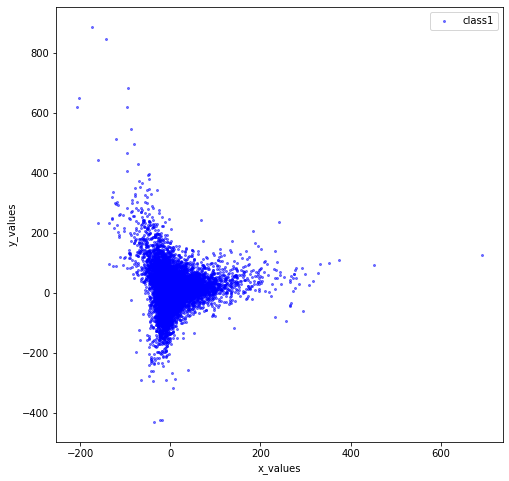

In [214]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
tocluster = pd.DataFrame(ps[[4,1]])
print(tocluster.shape)
print(tocluster.head())

fig = plt.figure(figsize=(8,8))
plt.plot(tocluster[4], tocluster[1], 'o', markersize=2, color='blue', alpha=0.5, label='class1')

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.show()

In [215]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

clusterer = KMeans(n_clusters=4,random_state=42).fit(tocluster)
centers = clusterer.cluster_centers_
c_preds = clusterer.predict(tocluster)
print(centers)

[[ -0.11794348   0.10272824]
 [ 76.8446784   26.26944397]
 [ -4.70353254 -40.54493812]
 [-11.27576295  65.27501086]]


['yellow', 'green', 'yellow', 'yellow', 'yellow', 'yellow', 'yellow', 'yellow', 'yellow', 'yellow']


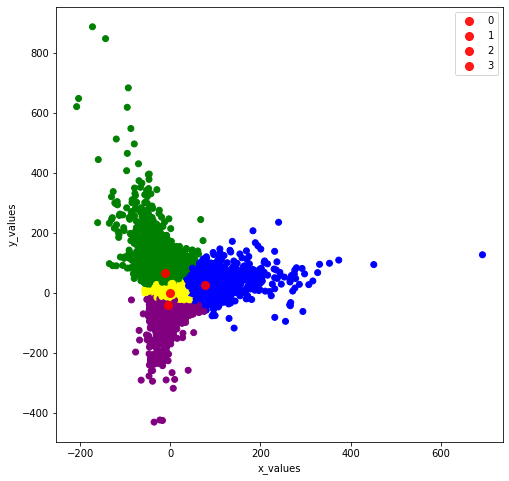

In [216]:
fig = plt.figure(figsize=(8,8))
colors = ['yellow','blue','purple','green']
colored = [colors[k] for k in c_preds]
print(colored[0:10])
plt.scatter(tocluster[4],tocluster[1],  color = colored)
for ci,c in enumerate(centers):
    plt.plot(c[0], c[1], 'o', markersize=8, color='red', alpha=0.9, label=''+str(ci))

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.show()

Here’s how our clusters appear. You can see that there are 4 clusters associated with 4 different colors (blue, green, purple, and yellow). The value 0, 1, 2, 3 circles are the centroids of each cluster.

We have found a possible clustering for our customers. Let's check if we also manage to find some interesting pattern beneath it.

In [217]:
frame = pd.DataFrame(tocluster)
frame['cluster'] = c_preds
frame['cluster'].value_counts()


0    187259
2     11171
3      5936
1      1843
Name: cluster, dtype: int64

In [218]:
frame

,4,1,cluster
0,0.269057,2.429427,0
1,-6.920946,36.751116,3
2,-0.442380,2.404383,0
3,-0.288231,-0.755823,0
4,0.612824,-2.637225,0
...,...,...,...
206204,0.318347,1.369802,0
206205,0.728529,-0.152500,0
206206,1.718302,7.701299,0
206207,9.035153,20.418734,0


In [219]:
clust_prod = cust_prod.copy()
clust_prod['cluster'] = c_preds

clust_prod.head(10)

aisle,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,body lotions soap,bread,breakfast bakery,breakfast bars pastries,bulk dried fruits vegetables,bulk grains rice dried goods,buns rolls,butter,candy chocolate,canned fruit applesauce,canned jarred vegetables,canned meals beans,canned meat seafood,cat food care,cereal,chips pretzels,cleaning products,cocoa drink mixes,coffee,cold flu allergy,condiments,cookies cakes,crackers,cream,deodorants,diapers wipes,digestion,dish detergents,dog food care,doughs gelatins bake mixes,dry pasta,eggs,energy granola bars,energy sports drinks,eye ear care,facial care,feminine care,first aid,food storage,fresh dips tapenades,fresh fruits,fresh herbs,fresh pasta,fresh vegetables,frozen appetizers sides,frozen breads doughs,frozen breakfast,frozen dessert,frozen juice,frozen meals,frozen meat seafood,frozen pizza,frozen produce,frozen vegan vegetarian,fruit vegetable snacks,grains rice dried goods,granola,hair care,honeys syrups nectars,hot cereal pancake mixes,hot dogs bacon sausage,ice cream ice,ice cream toppings,indian foods,instant foods,juice nectars,kitchen supplies,kosher foods,latino foods,laundry,lunch meat,marinades meat preparation,meat counter,milk,mint gum,missing,more household,muscles joints pain relief,nuts seeds dried fruit,oils vinegars,oral hygiene,other,other creams cheeses,packaged cheese,packaged meat,packaged poultry,packaged produce,packaged seafood,packaged vegetables fruits,paper goods,pasta sauce,pickled goods olives,plates bowls cups flatware,popcorn jerky,poultry counter,prepared meals,prepared soups salads,preserved dips spreads,protein meal replacements,red wines,refrigerated,refrigerated pudding desserts,salad dressing toppings,seafood counter,shave needs,skin care,soap,soft drinks,soup broth bouillon,soy lactosefree,specialty cheeses,specialty wines champagnes,spices seasonings,spirits,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt,cluster
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,3,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9,0,0,0,0,8,0,0,0,0,0,2,0,0,0,12,0,0,0,0,0,0,0,0,0,0,0,0,0,13,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,0,3,0,0,0,0,2,0,0,0,0,1,1,2,0,0,0,0,0,0,0,0,1,0,0,12,0,0,0,0,5,0,11,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,9,33,0,0,0,0,1,0,0,0,12,0,0,0,4,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,10,0,0,0,0,0,0,0,3,0,1,0,0,5,0,1,0,0,3,0,0,1,0,10,0,0,1,0,0,0,5,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,1,0,0,0,0,2,0,42,3
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,0,0,5,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,1,5,0,0,0,0,14,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,15,0,0,0,0,4,1,0,0,0,0,0,2,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,2,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0
5,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,4,1,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,0,0,0,0,0,0,0,0,1,0,0,3,0,0,0,0,0,1,0,0,0,1,0,0,0,0,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,2,0,0,0,0,5,0,0,0,0,0,1,0

(206209, 135)


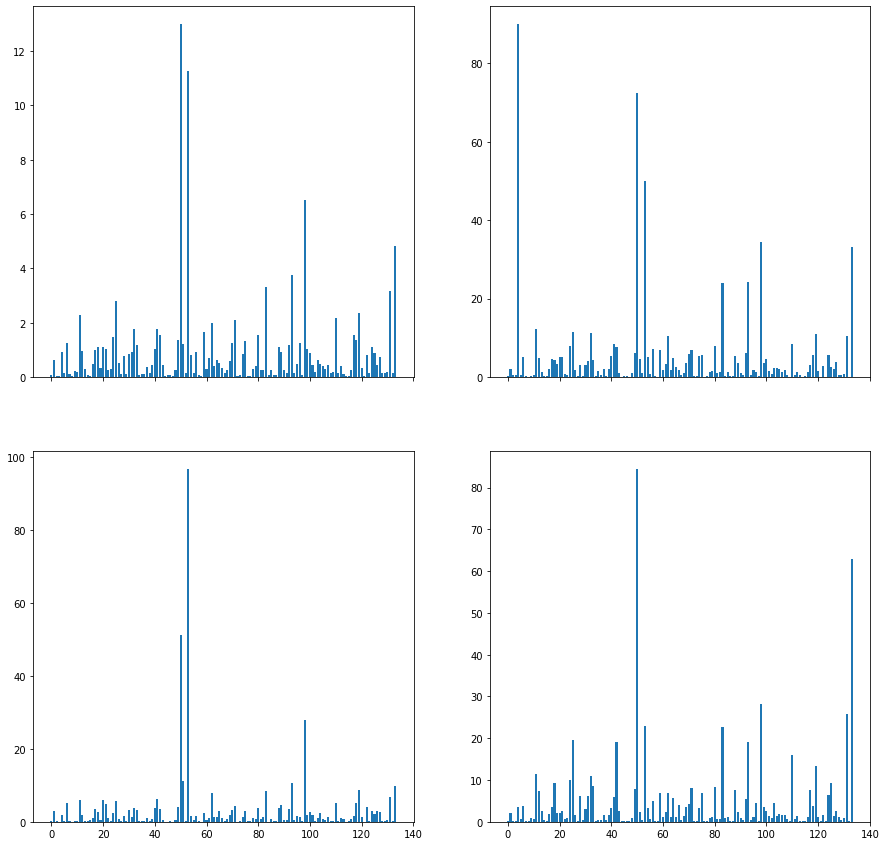

In [220]:
print (clust_prod.shape)
f,arr = plt.subplots(2,2,sharex=True,figsize=(15,15))
c1_count = len(clust_prod[clust_prod['cluster']==0])
c0 = clust_prod[clust_prod['cluster']==0].drop('cluster',axis=1).mean()
arr[0,0].bar(range(len(clust_prod.drop('cluster',axis=1).columns)),c0)
c1 = clust_prod[clust_prod['cluster']==1].drop('cluster',axis=1).mean()
arr[0,1].bar(range(len(clust_prod.drop('cluster',axis=1).columns)),c1)
c2 = clust_prod[clust_prod['cluster']==2].drop('cluster',axis=1).mean()
arr[1,0].bar(range(len(clust_prod.drop('cluster',axis=1).columns)),c2)
c3 = clust_prod[clust_prod['cluster']==3].drop('cluster',axis=1).mean()
arr[1,1].bar(range(len(clust_prod.drop('cluster',axis=1).columns)),c3)
plt.show()

Here are the top 10 products bought by customers belonging to different clusters.


In [221]:
c0.sort_values(ascending=False)[0:10]

aisle
fresh fruits                     12.994879
fresh vegetables                 11.257825
packaged vegetables fruits        6.531195
yogurt                            4.839655
packaged cheese                   3.754372
milk                              3.302912
water seltzer sparkling water     3.168702
chips pretzels                    2.782574
soy lactosefree                   2.349543
bread                             2.278710
dtype: float64

In [222]:
c1.sort_values(ascending=False)[0:10]

aisle
baby food formula             90.056430
fresh fruits                  72.362453
fresh vegetables              50.082474
packaged vegetables fruits    34.570266
yogurt                        33.253391
packaged cheese               24.314162
milk                          24.007596
bread                         12.206186
chips pretzels                11.463918
crackers                      11.253391
dtype: float64

In [223]:
c2.sort_values(ascending=False)[0:10]

aisle
fresh vegetables                 96.824993
fresh fruits                     51.364873
packaged vegetables fruits       27.885686
fresh herbs                      11.303912
packaged cheese                  10.637365
yogurt                            9.916570
soy lactosefree                   8.791156
milk                              8.350371
frozen produce                    7.802435
water seltzer sparkling water     6.771909
dtype: float64

In [224]:
c3.sort_values(ascending=False)[0:10]

aisle
fresh fruits                     84.504549
yogurt                           63.007075
packaged vegetables fruits       28.144205
water seltzer sparkling water    25.794306
fresh vegetables                 22.903976
milk                             22.740398
chips pretzels                   19.468497
packaged cheese                  19.050202
energy granola bars              19.037567
refrigerated                     16.020553
dtype: float64

Analysis:

These items are bought by all the customers.
<br>fresh fruits
<br>fresh vegetables
<br>packaged vegetables fruits
<br>yogurt
<br>packaged cheese
<br>milk
<br>water seltzer sparkling water
<br>are products which are genereically bought by the majority of the customers.

As you can see in cluster c1, the cluster is charachterized by baby food. So we can assume that these clusters are formed not by the quantities but by the products which are not in the lists above. 

In [225]:
from IPython.display import display, HTML
cluster_means = [[c0['fresh fruits'],c0['fresh vegetables'],c0['packaged vegetables fruits'], c0['yogurt'], c0['packaged cheese'], c0['milk'],c0['water seltzer sparkling water'],c0['chips pretzels']],
                 [c1['fresh fruits'],c1['fresh vegetables'],c1['packaged vegetables fruits'], c1['yogurt'], c1['packaged cheese'], c1['milk'],c1['water seltzer sparkling water'],c1['chips pretzels']],
                 [c2['fresh fruits'],c2['fresh vegetables'],c2['packaged vegetables fruits'], c2['yogurt'], c2['packaged cheese'], c2['milk'],c2['water seltzer sparkling water'],c2['chips pretzels']],
                 [c3['fresh fruits'],c3['fresh vegetables'],c3['packaged vegetables fruits'], c3['yogurt'], c3['packaged cheese'], c3['milk'],c3['water seltzer sparkling water'],c3['chips pretzels']]]
cluster_means = pd.DataFrame(cluster_means, columns = ['fresh fruits','fresh vegetables','packaged vegetables fruits','yogurt','packaged cheese','milk','water seltzer sparkling water','chips pretzels'])
HTML(cluster_means.to_html())

,fresh fruits,fresh vegetables,packaged vegetables fruits,yogurt,packaged cheese,milk,water seltzer sparkling water,chips pretzels
0,12.994879,11.257825,6.531195,4.839655,3.754372,3.302912,3.168702,2.782574
1,72.362453,50.082474,34.570266,33.253391,24.314162,24.007596,10.526858,11.463918
2,51.364873,96.824993,27.885686,9.916570,10.637365,8.350371,6.771909,5.793125
3,84.504549,22.903976,28.144205,63.007075,19.050202,22.740398,25.794306,19.468497


This table depicts the percentage these goods with respect to the other top 8 in each cluster. Now few differences amoung the clusters are found. These are interesting patterns to look at.

As you can see, people in cluster 3 buy most frest fruits follow by cluster 1. 
<br>People from cluster 2 buy significantly more fresh vegetables than other clusters. 
<br> Cluster 1 buys the least amount of packaged vegetables. 
<br> Cluster 1 actually seems to the least amount of products.
<br> Clusters 1, 2 and 3 buy fruits and vegetables a lot. 


In [226]:
cluster_perc = cluster_means.iloc[:, :].apply(lambda x: (x / x.sum())*100,axis=1)
HTML(cluster_perc.to_html())

,fresh fruits,fresh vegetables,packaged vegetables fruits,yogurt,packaged cheese,milk,water seltzer sparkling water,chips pretzels
0,26.720777,23.148952,13.429798,9.951563,7.719945,6.791627,6.515658,5.721680
1,27.769645,19.219533,13.266604,12.761244,9.330746,9.213099,4.039763,4.399366
2,23.611160,44.508052,12.818359,4.558402,4.889733,3.838459,3.112879,2.662956
3,29.587059,8.019229,9.853958,22.060281,6.669930,7.961956,9.031202,6.816386


Below you see the products bought by different clusters after the top 10 products. 

In [227]:
c0.sort_values(ascending=False)[10:15]

aisle
refrigerated      2.168729
ice cream ice     2.082853
frozen produce    2.001527
eggs              1.777773
crackers          1.766115
dtype: float64

In [228]:
c1.sort_values(ascending=False)[10:15]

aisle
soy lactosefree                  11.008139
frozen produce                   10.575692
water seltzer sparkling water    10.526858
refrigerated                      8.534997
eggs                              8.321215
dtype: float64

In [229]:
c2.sort_values(ascending=False)[10:15]

aisle
eggs                        6.173664
canned jarred vegetables    6.091845
bread                       6.019425
chips pretzels              5.793125
refrigerated                5.276072
dtype: float64

In [230]:
c3.sort_values(ascending=False)[10:15]

aisle
soy lactosefree    13.441038
bread              11.520553
crackers           11.001685
cereal              9.974057
candy chocolate     9.356806
dtype: float64

As you can note by taking into account more products clusters start to differ significantly. 

## Association Analysis with Apriori Algorithm

In [231]:
#previous orders & products head
print(prior.head())
print(products.head())

   order_id  product_id  add_to_cart_order  reordered
0         2       33120                  1          1
1         2       28985                  2          1
2         2        9327                  3          0
3         2       45918                  4          1
4         2       30035                  5          0
   product_id                                       product_name  aisle_id  \
0           1                         Chocolate Sandwich Cookies        61   
1           2                                   All-Seasons Salt       104   
2           3               Robust Golden Unsweetened Oolong Tea        94   
3           4  Smart Ones Classic Favorites Mini Rigatoni Wit...        38   
4           5                          Green Chile Anytime Sauce         5   

   department_id  
0             19  
1             13  
2              7  
3              1  
4             13  


In [232]:
#Merging both prior and products
data = pd.merge(prior,products,on='product_id')
data.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id
0,2,33120,1,1,Organic Egg Whites,86,16
1,26,33120,5,0,Organic Egg Whites,86,16
2,120,33120,13,0,Organic Egg Whites,86,16
3,327,33120,5,1,Organic Egg Whites,86,16
4,390,33120,28,1,Organic Egg Whites,86,16


In [233]:
# restricting the data due to memory constraint
data = data[data['order_id']<10000]

#Making transaction data ready for Frequent item set mining.
df_item = data[['order_id','product_name']].copy()
df_item.rename(columns={'order_id':'order','product_name':'items'},inplace=True)
df_item['temp']=1
df = df_item.groupby(['order','items'])['temp'].sum().unstack().fillna(0)

The convert function is used to create 0 and 1 for each product. 

In [234]:
def convert(i):
    if i <= 0:
        return 0
    elif i>=1:
        return 1
    
df.applymap(convert)

items,& Go! Hazelnut Spread + Pretzel Sticks,0 Calorie Strawberry Dragonfruit Water Beverage,0% Fat Black Cherry Greek Yogurt y,0% Fat Blueberry Greek Yogurt,0% Fat Free Organic Milk,0% Fat Organic Greek Vanilla Yogurt,0% Fat Superfruits Greek Yogurt,0% Greek Strained Yogurt,0% Greek Yogurt Black Cherry on the Bottom,"0% Greek, Blueberry on the Bottom Yogurt",0% Milkfat Greek Plain Yogurt,0% Milkfat Greek Yogurt Honey,1 % Lowfat Milk,1 Apple + 1 Mango Fruit Bar,1 Apple + 1 Pear Fruit Bar,1 Liter,1 Ply Paper Towels,1 Razor Handle and 2 Freesia Scented Razor Refills Premium BladeRazor System,1% Low Fat Chocolate Milk,1% Low Fat Milk,1% Lowfat Cottage Cheese,1% Lowfat Milk,1% Lowfat Organic Milk,1% Milk,1% Milkfat Low Fat Buttermilk,1% Milkfat Low Fat Vitamin A & D Milk,1% Milkfat Lowfat Cottage Cheese,"1,000 mg Vitamin C Lemon-Lime Flavored Fizzy Drink Mix - 30 PK",1/3 Less Fat Chive & Onion Cream Cheese,1/3 Less Fat Cream Cheese,10 oz Paper Bowls,100 Calorie Per Bag Popcorn,100 Calorie Healthy Pop Butter 1.2 Oz Mini Bags Microwave Pop Corn,100 Calorie Pretzels Packs,100 Calorie Vanilla Roast Almonds,100% Apple Juice,100% Apple Juice Original,"100% Apple Juice, Original",100% Baby Kale,100% Cacao Unsweetened Chocolate Baking Bar,100% Carrot Juice,100% Colombia Supremo Medium,100% Colombian Ground Medium Dark Coffee,100% Columbian Medium Coffee,100% Cotton 16 Ply Strength 25 ft Cooking Twine,100% Cotton Swabs,100% Cranberry Juice,100% Egg Whites,100% Extra Virgin Olive Oil Spray,100% Florida Orange Juice,100% Goats Milk,100% Grass-Fed Organic Plain Creamline Yogurt,100% Grated Parmesan Cheese,100% Guava Juice,100% Juice,100% Juice Apple Juice,"100% Juice Apple Juice, No Sugar Added",100% Juice Medley Of Fruits,100% Juice No Added Sugar Orange Tangerine,100% Juice No Sugar Added Apple,100% Juice No Sugar Added Pure Pineapple,100% Juice Peach,"100% Juice, Apple","100% Juice, Pear Nectar",100% Lactose Free 1% Lowfat Milk,100% Lactose Free Fat Free Milk,100% Lactose Free Milk,100% Lactose Free Organic 2% Reduced Fat Milk,100% Lactose Free Reduced Fat Calcium Enriched Milk,100% Lactose Free Reduced Fat Milk,100% Lactose Free Whole Calcium Enriched Milk,100% Lemon Juice,100% Lime Juice,100% Liquid Egg Whites,100% Mango Juice,100% Mighty Mango Juice Smoothie,100% Natural America's Favorite Tea,100% Natural Beef Broth,100% Natural Broccoli Sprouts With Long Lasting Antioxidant Activity,100% Natural Creamy Peanut Butter,100% Natural Crunchy Peanut Butter,100% Natural Diced Fire Roasted Tomatoes,100% Natural Diced Tomatoes,100% Natural No Salt Added Tomato Sauce,100% Natural Petite Diced Tomatoes,100% Natural Spring Water,100% Natural Spring Water Minis,100% Natural Stewed Tomatoes,100% Natural Sweetener Zero Calorie Packets,100% Natural Tomato Sauce,100% O-J Juice,100% Oatnut Bread,100% Orange Juice,100% Orange Strawberry Banana Juice,100% Organic All-Natural Dried Pineapple,100% Organic Diced Tomatoes,100% Organic Einkorn All-Purpose Flour,100% Organic Premium Whole Wheat Flour,100% Organic Pure & Unfiltered Cold Pressed Flax Oil,100% Organic Rainbow Heirloom Quinoa,100% Organic Raw Coconut Butter,100% Organic Unbleached All-Purpose Flour,100% Organic Whole Peeled Tomatoes,100% Papaya Juice,100% Pineapple Juice,100% Plant Protein Beastley Sliders,100% Pomegranate Blueberry Juice,100% Pomegranate Juice,100% Premium Arabica Ground Coffee,100% Premium Select Not From Concentrate Pure Prune Juice,100% Pure Apple Juice,100% Pure Avocado Oil,100% Pure Coconut Water,100% Pure Concord Grape Juice,100% Pure Corn Oil,100% Pure Corn Starch,100% Pure Grade A Dark Amber Maple Syrup,100% Pure Jojoba Oil,100% Pure Lavender Oil,100% Pure Maple Syrup,100% Pure Maple Syrup Grade A Dark Amber,100% Pure Olive Oil,100% Pure Organic Apple Juice,100% Pure Organic Maple Syrup Grade A,100% Pure Pumpkin,100% Pure Rosemary,100% Pure Sensitive Skin Care Grape Seed Oil,100% Pure Sesame Seed Oil,100% Pure Versatile Skin Care Castor Oil,100% Raw Coconut Water,100% Raw

In [235]:
freq_itemsets = apriori(df,min_support=0.01,use_colnames=True)
freq_itemsets

,support,itemsets
0,0.012304,(100% Raw Coconut Water)
1,0.018456,(100% Whole Wheat Bread)
2,0.012410,(2% Reduced Fat Milk)
3,0.026517,(Apple Honeycrisp Organic)
4,0.019092,(Asparagus)
...,...,...
110,0.018562,"(Banana, Organic Strawberries)"
111,0.013577,"(Banana, Strawberries)"
112,0.012516,"(Organic Baby Spinach, Organic Strawberries)"
113,0.011773,"(Organic Hass Avocado, Organic Strawberries)"


In [236]:
#Association Rules mining
rules = association_rules(freq_itemsets,metric='lift',min_threshold=1)
rules.sort_values(by='confidence',ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
9,(Honeycrisp Apple),(Banana),0.026411,0.149130,0.010182,0.385542,2.585271,0.006244,1.384749
15,(Organic Fuji Apple),(Banana),0.028214,0.149130,0.010395,0.368421,2.470465,0.006187,1.347210
5,(Organic Raspberries),(Bag of Organic Bananas),0.043063,0.120598,0.012940,0.300493,2.491684,0.007747,1.257173
2,(Organic Hass Avocado),(Bag of Organic Bananas),0.064807,0.120598,0.019304,0.297872,2.469956,0.011489,1.252481
21,(Strawberries),(Banana),0.045609,0.149130,0.013577,0.297674,1.996070,0.006775,1.211503
10,(Organic Avocado),(Banana),0.055579,0.149130,0.015592,0.280534,1.881136,0.007303,1.182641
27,(Organic Raspberries),(Organic Strawberries),0.043063,0.079338,0.010076,0.233990,2.949277,0.006660,1.201893
19,(Organic Strawberries),(Banana),0.079338,0.149130,0.018562,0.233957,1.568811,0.006730,1.110734
0,(Organic Baby Spinach),(Bag of Organic Bananas),0.072762,0.120598,0.015804,0.217201,1.801031,0.007029,1.123407
6,(Organic Strawberries),(Bag of Organic Bananas),0.079338,0.120598,0.017183,0.216578,1.795860,0.007615,1.122513


The confidence and the lift are important metrics in examining the apriori calculations. The confidence shows how likely an item appears with another particular item. The higher the confidence, the more likely the second item will appear along with the first item. The lift is a measurement that if it is greater than 1, it is more likely that the second item will be bought along with the first item. 

In [237]:
rules[(rules['confidence']>0.16) & (rules['lift']>2)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
2,(Organic Hass Avocado),(Bag of Organic Bananas),0.064807,0.120598,0.019304,0.297872,2.469956,0.011489,1.252481
3,(Bag of Organic Bananas),(Organic Hass Avocado),0.120598,0.064807,0.019304,0.160070,2.469956,0.011489,1.113418
5,(Organic Raspberries),(Bag of Organic Bananas),0.043063,0.120598,0.012940,0.300493,2.491684,0.007747,1.257173
9,(Honeycrisp Apple),(Banana),0.026411,0.149130,0.010182,0.385542,2.585271,0.006244,1.384749
15,(Organic Fuji Apple),(Banana),0.028214,0.149130,0.010395,0.368421,2.470465,0.006187,1.347210
22,(Organic Baby Spinach),(Organic Strawberries),0.072762,0.079338,0.012516,0.172012,2.168083,0.006743,1.111926
24,(Organic Hass Avocado),(Organic Strawberries),0.064807,0.079338,0.011773,0.181669,2.289812,0.006632,1.125049
27,(Organic Raspberries),(Organic Strawberries),0.043063,0.079338,0.010076,0.233990,2.949277,0.006660,1.201893


Above the rules are above the confidence of 0.16 and above the lift of 2.

It shows that fruits such as apples are most likely to be purchased with bananas. Most of the items are fruits and it suggests that customers will most likely buy more fruit given that they already bought some. 

In [238]:
rules[(rules['confidence']>=0.10) & (rules['lift']>=1.5)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Organic Baby Spinach),(Bag of Organic Bananas),0.072762,0.120598,0.015804,0.217201,1.801031,0.007029,1.123407
1,(Bag of Organic Bananas),(Organic Baby Spinach),0.120598,0.072762,0.015804,0.131047,1.801031,0.007029,1.067075
2,(Organic Hass Avocado),(Bag of Organic Bananas),0.064807,0.120598,0.019304,0.297872,2.469956,0.011489,1.252481
3,(Bag of Organic Bananas),(Organic Hass Avocado),0.120598,0.064807,0.019304,0.160070,2.469956,0.011489,1.113418
4,(Bag of Organic Bananas),(Organic Raspberries),0.120598,0.043063,0.012940,0.107300,2.491684,0.007747,1.071958
5,(Organic Raspberries),(Bag of Organic Bananas),0.043063,0.120598,0.012940,0.300493,2.491684,0.007747,1.257173
6,(Organic Strawberries),(Bag of Organic Bananas),0.079338,0.120598,0.017183,0.216578,1.795860,0.007615,1.122513
7,(Bag of Organic Bananas),(Organic Strawberries),0.120598,0.079338,0.017183,0.142480,1.795860,0.007615,1.073633
9,(Honeycrisp Apple),(Banana),0.026411,0.149130,0.010182,0.385542,2.585271,0.006244,1.384749
10,(Organic Avocado),(Banana),0.055579,0.149130,0.015592,0.280534,1.881136,0.007303,1.182641


Above the rules are above the confidence of 0.10 and above the lift of 1.5.

Given that these rules have a lower confidence and lift levels than the first examination of the rules, the list is much larger. Again, most of the items are fruits and show that it is most likely that customers will buy more fruits. 

## Findings:
- Majority of customers buy fruits and vegetables
- If a customer has fruit in their basket, they will most likely buy more fruits
- If a customer buys apples, they will most likely buy bananas as well
- More customers shop on Sundays and Mondays
- Customers purchase items between 10am to 4pm
- Reordering items most likely happens a week after or a month after purchase

## Limitations and Future Improvements:
- There are too many rows for a local computer to store in memory and process
- The data had to be limited for analysis
- Examination of more data with the use of chunking
- Future use of different metrics of confidence and lift